<a href="https://colab.research.google.com/github/eladvromen/audio-analysis/blob/main/audio_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#find the first drum in viva la vida
<img src="https://m.media-amazon.com/images/I/411f3FS9i+L._AC_.jpg" >

answers to questions:
1. BPM - 138(by google)
2. Time when the first drum hits (28)
3. Time when the first chorus instance starts (1:23)
4. Start Time and End Time of the introduction part (0:27.2)
5. (Bonus) Number of bars in the introduction part (original is 4, I think here its 8)


##imports

In [ ]:
!pip install youtube-dl 
!pip install librosa 
!pip install matplotlib 
!pip install numpy 
!pip install ipympl 
import IPython.display as ipd 
from google.colab import output 
output.enable_custom_widget_manager() 
%matplotlib widget 


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
ydl_opts = { 
'format': 'bestaudio/best', 
'postprocessors': [{ 
'key': 'FFmpegExtractAudio', 
'preferredcodec': 'wav', 
'preferredquality': '320', 
}],
} 


In [ ]:
import youtube_dl

In [ ]:
with youtube_dl.YoutubeDL(ydl_opts) as ydl: 
  ydl.download(['https://www.youtube.com/watch?v=-ZvsGmYKhcU'])


[youtube] -ZvsGmYKhcU: Downloading webpage
[download] Destination: Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.m4a
[download] 100% of 3.82MiB in 01:21
[ffmpeg] Correcting container in "Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.m4a"
[ffmpeg] Destination: Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav
Deleting original file Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.m4a (pass -k to keep)


In [ ]:
import matplotlib.pyplot as plt 
import librosa 
import librosa.display 
import numpy as np 



##EDA

###first look

In [ ]:
y, sr = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav") 

D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max) 


In [ ]:
#ipd.display(ipd.Audio(y, rate=sr)) 

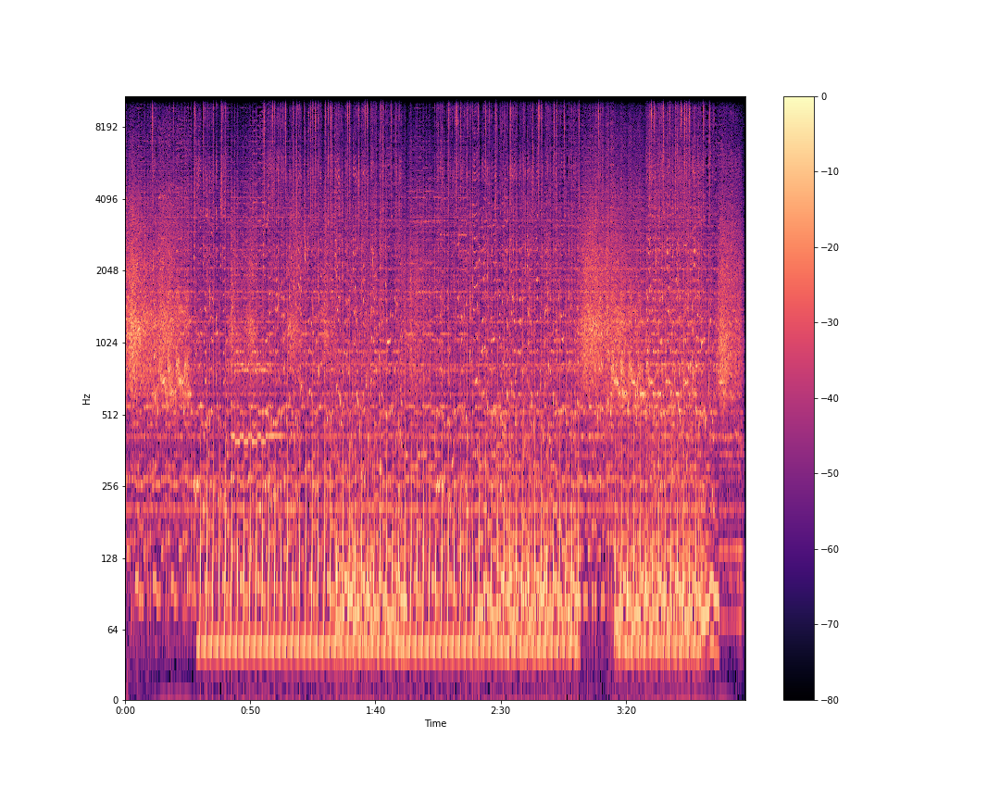

In [ ]:
#spectogram of the whole song
plt.figure(figsize=(15,12)) 
librosa.display.specshow(D, y_axis='log', x_axis='time',sr=sr)
plt.colorbar()

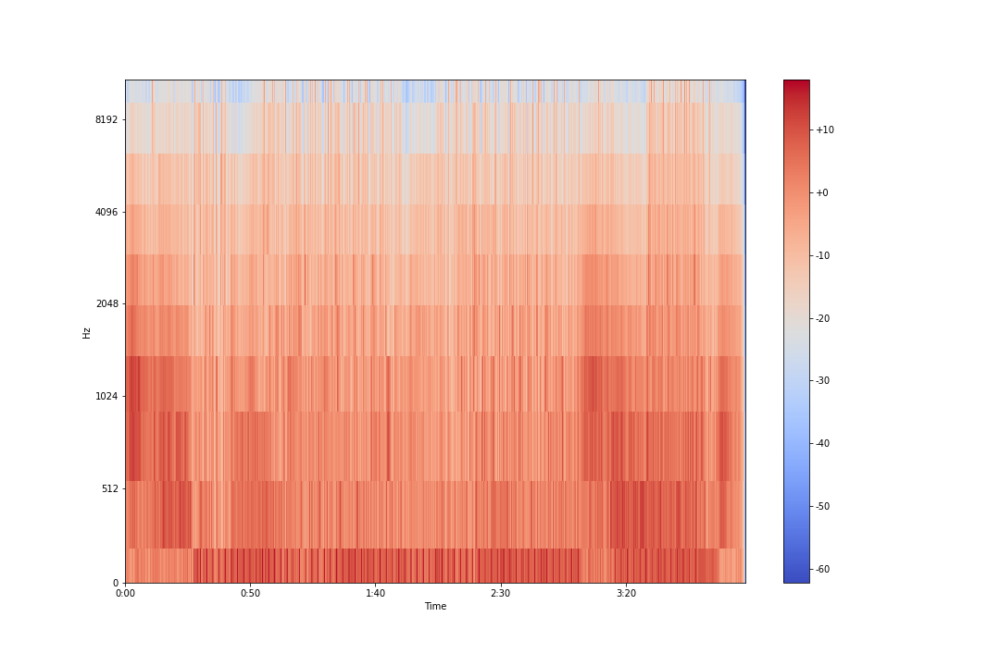

In [ ]:
#mel spectogram of the whole song
filter_banks = librosa.filters.mel(n_fft=2048, sr=22050, n_mels=10)
mel_spectrogram = librosa.feature.melspectrogram(y, sr=sr, n_fft=2048, hop_length=512, n_mels=10)
log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
plt.figure(figsize=(15, 10))
librosa.display.specshow(log_mel_spectrogram, 
                         x_axis="time",
                         y_axis="mel", 
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()

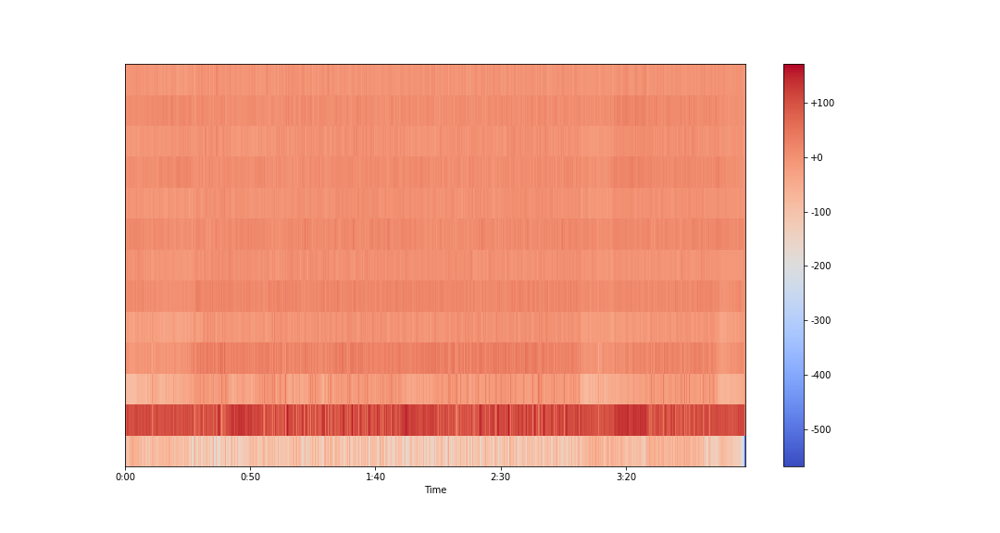

In [ ]:
#mfcc of the whole song
mfccs = librosa.feature.mfcc(y, n_mfcc=13, sr=sr)
plt.figure(figsize=(15, 8))
librosa.display.specshow(mfccs, 
                         x_axis="time", 
                         sr=sr)
plt.colorbar(format="%+2.f")
plt.show()

###getting to buisness

In [ ]:
#a lot of chunks of the song
y_break, sr_break = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 180, duration =20 ) 
y_intro, sr_intro = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 26.5, duration =5 ) 
y_intro_long, sr_intro_long = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 25, duration =10 ) 
y_sing, sr_sing = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 27.2, duration =2 ) 
y_intro_vs, sr_intro_vs = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 26.5, duration =2 ) 
y_3_drum, sr_3_drum = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 27.5, duration =2 )
y_no_drum, sr_no_drum = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 26, duration =2 ) 
y_drum_1, sr_drum_1 = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 29, duration =2 ) 
y_drum_2, sr_drum_2 = librosa.load("/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav", offset = 35, duration =2 )

In [ ]:
#display_audio(y_drum_2, sr_drum_2)

In [ ]:
def plot_spec(y,sr,x,y_ax):
  #func for ploting spectogram
  D= librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max) 
  plt.figure(figsize=(x,y_ax)) 
  librosa.display.specshow(D, y_axis='log', x_axis='time',sr=sr)
  plt.colorbar()
  plt.tight_layout()
  

In [ ]:
def plot_mel_spec(y,sr,x,y_ax):
  #func for ploting mel spectogram
  filter_banks = librosa.filters.mel(n_fft=2048, sr=22050, n_mels=10)
  mel_spectrogram = librosa.feature.melspectrogram(y, sr=sr, n_fft=2048, hop_length=512, n_mels=10)
  log_mel_spectrogram = librosa.power_to_db(mel_spectrogram)
  plt.figure(figsize=(x, y_ax))
  librosa.display.specshow(log_mel_spectrogram, 
                          x_axis="time",
                          y_axis="mel", 
                          sr=sr)
  plt.colorbar(format="%+2.f")
  plt.show()

In [ ]:
def voice_instruments_split(y, sr, plot = True):
  #trying a simple method for splitting differ backround and main singing
  #return the different masks ready for istft for playing
    S_full, phase = librosa.magphase(librosa.stft(y))
    S_filter = librosa.decompose.nn_filter(S_full,
                                       aggregate=np.median,
                                       metric='cosine',
                                       width=int(librosa.time_to_frames(2, sr=sr)))
    S_filter = np.minimum(S_full, S_filter)
        # We can also use a margin to reduce bleed between the vocals and instrumentation masks.
    # Note: the margins need not be equal for foreground and background separation
    margin_i, margin_v = 2, 10
    power = 2

    mask_i = librosa.util.softmask(S_filter,
                                  margin_i * (S_full - S_filter),
                                  power=power)

    mask_v = librosa.util.softmask(S_full - S_filter,
                                  margin_v * S_filter,
                                  power=power)

    # Once we have the masks, simply multiply them with the input spectrum
    # to separate the components

    S_foreground = mask_v * S_full
    S_background = mask_i * S_full

    #plotting
    if plot:
      plt.figure(figsize=(12, 8))
      plt.subplot(3, 1, 1)
      librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                              y_axis='log', sr=sr_intro)
      plt.title('Full spectrum')
      plt.colorbar()

      plt.subplot(3, 1, 2)
      librosa.display.specshow(librosa.amplitude_to_db(S_background, ref=np.max),
                              y_axis='log', sr=sr_intro)
      plt.title('Background')
      plt.colorbar()
      plt.subplot(3, 1, 3)
      librosa.display.specshow(librosa.amplitude_to_db(S_foreground, ref=np.max),
                              y_axis='log', x_axis='time', sr=sr_intro)
      plt.title('Foreground')
      plt.colorbar()
      plt.tight_layout()
      plt.show()
    return S_full*phase, S_background*phase, S_foreground*phase

In [ ]:
def display_audio(y,sr):
    ipd.display(ipd.Audio(y, rate=sr)) 

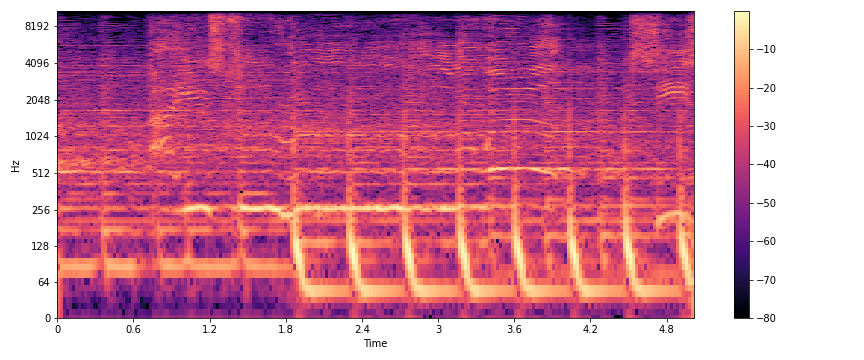

In [ ]:
plot_spec(y_intro,sr_intro, 12,5)

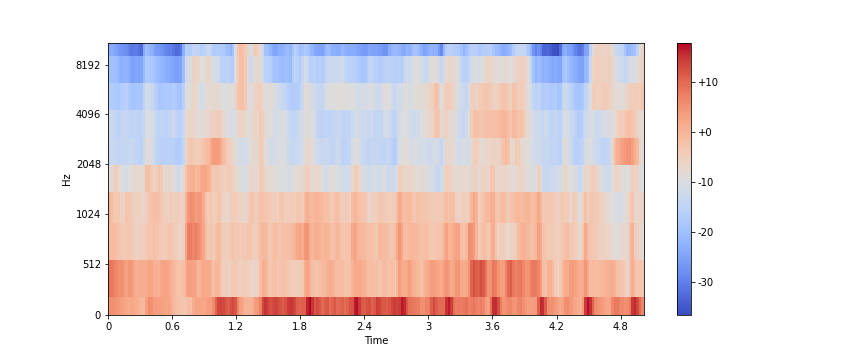

In [ ]:

plot_mel_spec(y_intro,sr_intro,12,5)




In [ ]:
display_audio(y_intro, sr_intro)

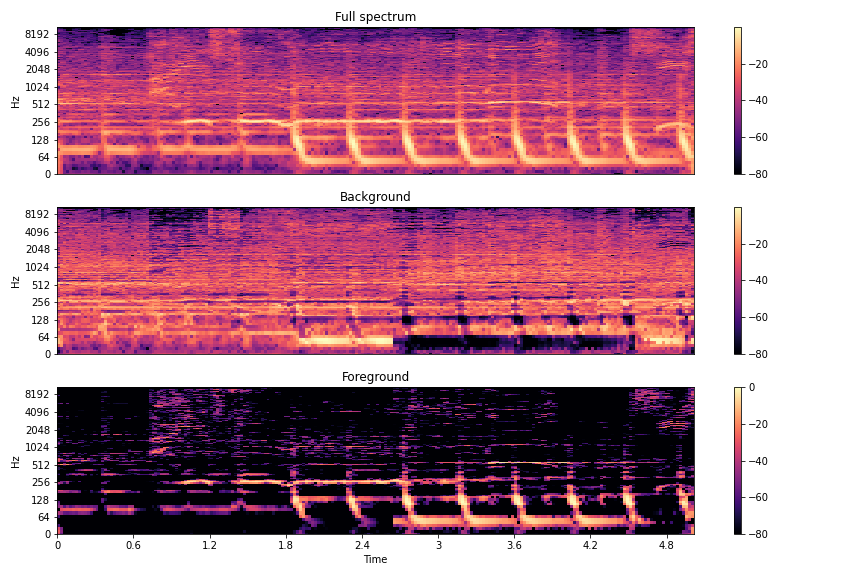

In [ ]:
n = len(y_intro)
intro_full, intro_back, intro_fore = voice_instruments_split(y_intro, sr_intro)

In [ ]:
#if we want to listen to the new seperated piece, we need to get the inverse
intro_out = librosa.istft(intro_full, length=n)
intro_back_out = librosa.istft(intro_back, length=n)
intro_fore_out = librosa.istft(intro_fore, length=n)


In [ ]:
def find_picks(y,sr):
  #a function to find picks
  onset_env = librosa.onset.onset_strength(y=y, sr=sr,
                                          hop_length=512,
                                          aggregate=np.median)
  peaks = librosa.util.peak_pick(onset_env, pre_max=3, post_max=3, pre_avg=3, post_avg=5, delta=0.5, wait=10)
  times = librosa.times_like(onset_env, sr=sr, hop_length=512)
  fig, ax = plt.subplots(nrows=2, sharex=True)
  D = np.abs(librosa.stft(y))
  librosa.display.specshow(librosa.amplitude_to_db(D, ref=np.max),
                          y_axis='log', x_axis='time', ax=ax[1])
  ax[0].plot(times, onset_env, alpha=0.8, label='Onset strength')
  ax[0].vlines(times[peaks], 0,
              onset_env.max(), color='r', alpha=0.8,
              label='Selected peaks')
  ax[0].legend(frameon=True, framealpha=0.8)
  ax[0].label_outer()
  return peaks

In [ ]:
display_audio(intro_out, sr_intro)

In [ ]:
display_audio(intro_back_out, sr_intro)

In [ ]:
display_audio(intro_fore_out, sr_intro)

In [ ]:
#voice_instruments_split(y_intro_long, sr_intro_long)

In [ ]:
#voice_instruments_split(y, sr)

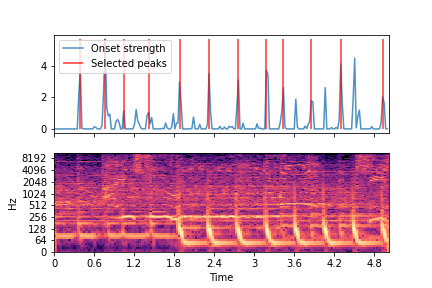

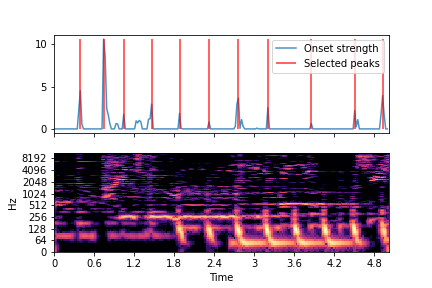

In [ ]:
peaks_full =  find_picks(y_intro,sr_intro)
peak_fore = find_picks(intro_fore_out,sr_intro)


nice plots. not informative enought for our needs

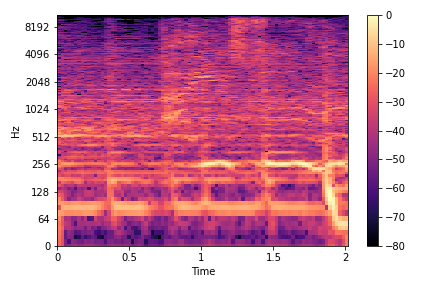

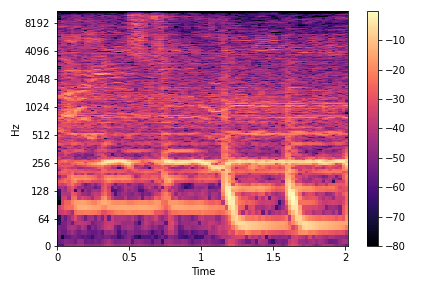

In [ ]:
plot_spec(y_intro_vs, sr_intro_vs,6,4) 
plot_spec(y_sing, sr_sing,6,4) 

In [ ]:
display_audio(y_intro_vs, sr_intro_vs)
display_audio(y_sing, sr_sing)

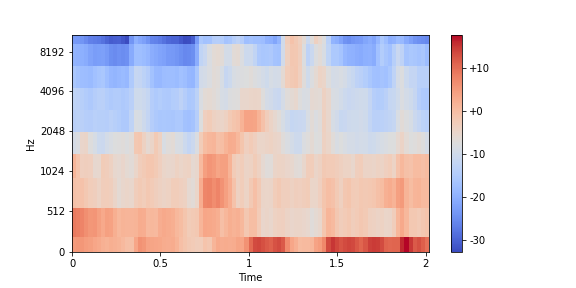

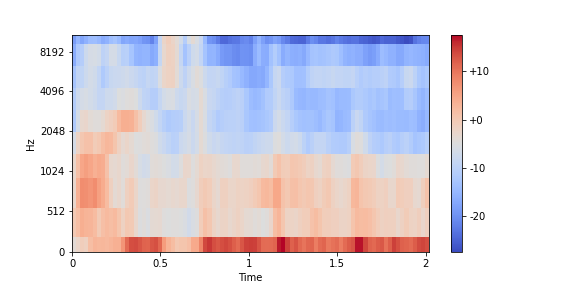

In [ ]:
plot_mel_spec(y_intro_vs, sr_intro_vs,8,4)
plot_mel_spec(y_sing, sr_sing,8,4)

ok! those last four spectograms has revealed- 

the spectogram's big "scratches" ranges from around 60-250 db are the drums.

the mel spectogram dark brown stripe at the bottom seems to coordinate with singing. 

now how we extract those?

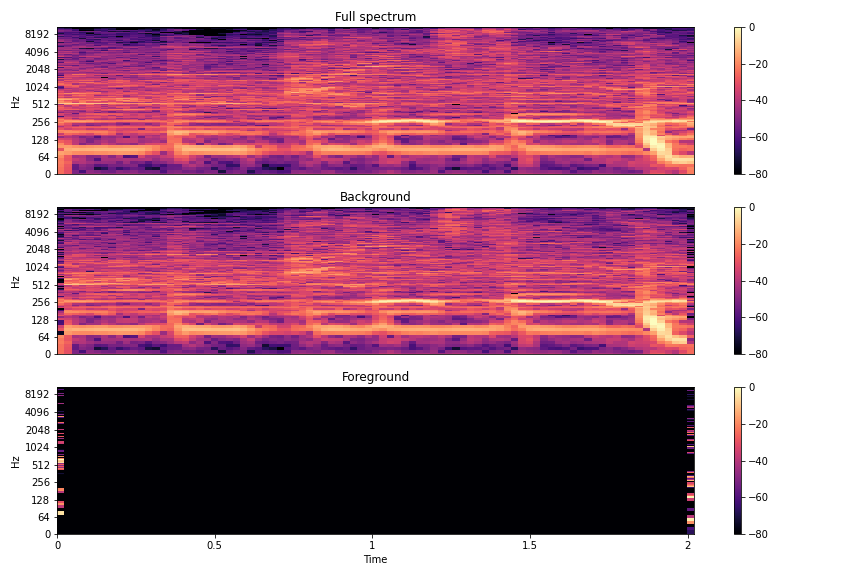

In [ ]:
n_vs = len(y_intro_vs)
intro_full_vs, intro_back_vs, intro_fore_vs  =voice_instruments_split(y_intro_vs, sr_intro_vs)
intro_out_vs = librosa.istft(intro_full, length=n_vs)
intro_back_out_vs = librosa.istft(intro_back, length=n_vs)
intro_fore_out_vs = librosa.istft(intro_fore, length=n_vs)

it seems that the seperation is not very useful on small chuncks

In [ ]:
display_audio(intro_back_out_vs, sr_intro_vs)

since we saw that the begining of the drums is represented by a big jump in low frequencys, lets try to use BER to compare the relation between high and low freqs.

In [ ]:
import math

In [ ]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [ ]:
intro_spec = librosa.stft(y_intro,n_fft=FRAME_SIZE, hop_length=HOP_SIZE)

In [ ]:
def calculate_split_frequency_bin(split_frequency, sample_rate, num_frequency_bins):
    """Infer the frequency bin associated to a given split frequency."""
    
    frequency_range = sample_rate / 2
    frequency_delta_per_bin = frequency_range / num_frequency_bins
    split_frequency_bin = math.floor(split_frequency / frequency_delta_per_bin)
    return int(split_frequency_bin)

In [ ]:
def band_energy_ratio(spectrogram, split_frequency, sample_rate):
    """Calculate band energy ratio with a given split frequency."""
    
    split_frequency_bin = calculate_split_frequency_bin(split_frequency, sample_rate, len(spectrogram[0]))
    band_energy_ratio = []
    
    # calculate power spectrogram
    power_spectrogram = np.abs(spectrogram) ** 2
    power_spectrogram = power_spectrogram.T
    
    # calculate BER value for each frame
    for frame in power_spectrogram:
        sum_power_low_frequencies = frame[:split_frequency_bin].sum()
        sum_power_high_frequencies = frame[split_frequency_bin:].sum()
        band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies
        band_energy_ratio.append(band_energy_ratio_current_frame)
    
    return np.array(band_energy_ratio)

In [ ]:
def calc_BER(y,sr,s_f, y_lim, plot =True):
  #getting the piece chunck parameters, split freq and y_lim for graph ploting
  #return the BER array for all the frames
  intro_spec = librosa.stft(y,n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
  ber_intro = band_energy_ratio(intro_spec, s_f, sr)
  frames = range(len(ber_intro))
  t = librosa.frames_to_time(frames, hop_length=HOP_SIZE)
  if plot:
    plt.figure(figsize=(6, 4))

    plt.plot(t, ber_intro, color="b")

    plt.ylim((0, y_lim))
    plt.show()
  return ber_intro

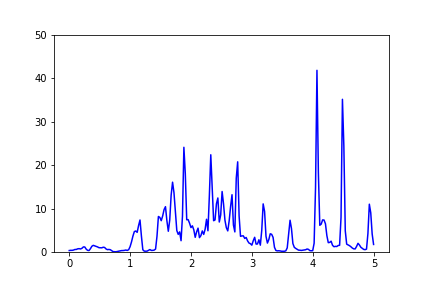

In [ ]:
ber_intro = calc_BER(y_intro,sr_intro,2500, 50)

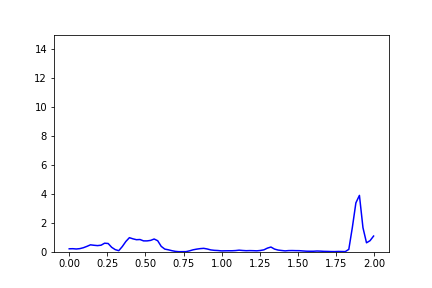

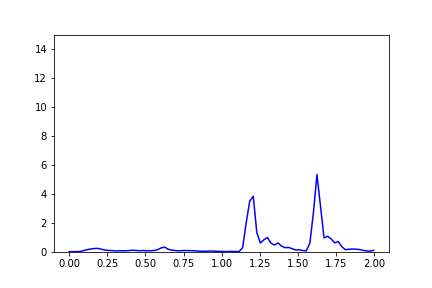

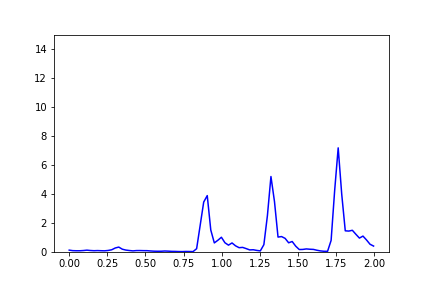

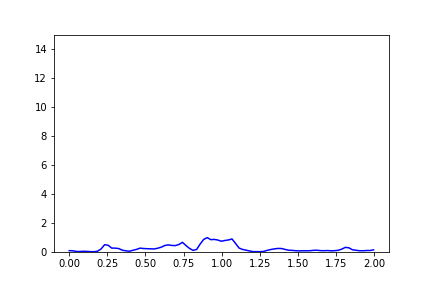

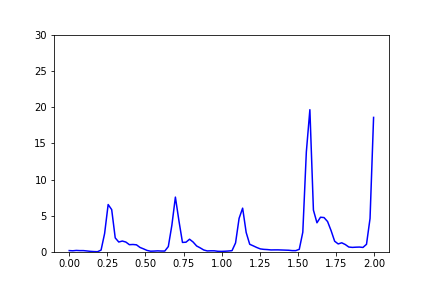

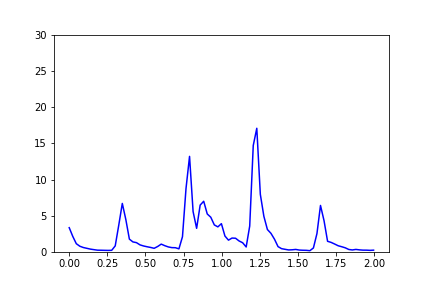

In [ ]:
ber_vs = calc_BER(y_intro_vs,sr_intro_vs,2500, 15)
ber_sing = calc_BER(y_sing,sr_sing,2500, 15)
ber_3 = calc_BER(y_3_drum,sr_3_drum,2500, 15)
ber_no =calc_BER(y_no_drum,sr_no_drum,2500, 15)
ber_d_1 = calc_BER(y_drum_1,sr_drum_1,2500, 30)
ber_d_2 =calc_BER(y_drum_2,sr_drum_2,2500, 30)


<ipython-input-96-f1fed1d510dd>:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6, 4))


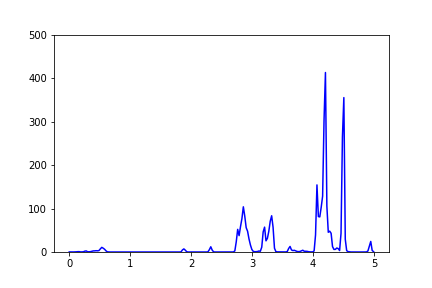

In [ ]:
#check if the fore version is interesting, it is, but not as clear
ber_fore =calc_BER(intro_fore_out, sr_intro,1000, 500)

In [ ]:
display_audio(intro_fore_out, sr_intro)

<ipython-input-95-1da5894b8c9d>:15: RuntimeWarning: invalid value encountered in float_scalars
  band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies


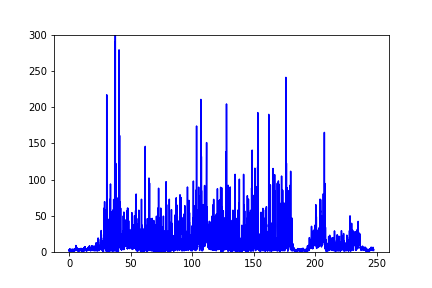

In [ ]:
ber_full = calc_BER(y,sr,128, 300)

insights:

when using 2 sec intervals with limit frequency of around 2500 as parameters,calculating the BER gives us a very good representation of drum bits.

now we need to find the spikes, which are drum bits.

##the model

In [ ]:
def get_first_drum_timing(seg_ber,lim):
  #get back the time were the first pick was ditected
  frames = range(len(seg_ber))
  t = librosa.frames_to_time(frames, hop_length=HOP_SIZE)
  index = np.argmax(seg_ber>lim)#first peak
  time = t[index]
  return time





In [ ]:
get_first_drum_timing(ber_vs,2)

1.8808163265306121

In [ ]:
get_first_drum_timing(ber_sing,2)

1.1609977324263039

In [ ]:
lim =2
def get_first_drum(lim, link, freq_lim =2500, initial=0):
  #iterate over girst 50 sec of song and find the first kick
  for i in range(initial,50,2):
    y_seg, sr_seg = librosa.load(link, offset = i, duration =2 )
    seg_ber = calc_BER(y_seg, sr_seg,freq_lim, 15, False)
    if len(seg_ber[seg_ber>lim])>0:#if theres a spike
      first_drum =get_first_drum_timing(seg_ber,lim)#calc the time of first drum
      return i+first_drum 
  return 0


  



In [ ]:
viva = "/content/Coldplay - Viva La Vida (Live In São Paulo)--ZvsGmYKhcU.wav"

first_drum = get_first_drum(lim, viva)

<ipython-input-95-1da5894b8c9d>:15: RuntimeWarning: invalid value encountered in float_scalars
  band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies


In [ ]:
print("the first drum is at:", first_drum)

the first drum is at: 28.371519274376418


it works.

##generalization:

In [ ]:
with youtube_dl.YoutubeDL(ydl_opts) as ydl: 
  ydl.download(['https://www.youtube.com/watch?v=RKMI_bQLYO8&ab_channel=DopeLemonVEVO'])

[youtube] RKMI_bQLYO8: Downloading webpage
[download] Destination: Dope Lemon - Hey You-RKMI_bQLYO8.webm
[download] 100% of 5.26MiB in 01:41
[ffmpeg] Destination: Dope Lemon - Hey You-RKMI_bQLYO8.wav
Deleting original file Dope Lemon - Hey You-RKMI_bQLYO8.webm (pass -k to keep)


In [ ]:

dope = '/content/Dope Lemon - Hey You-RKMI_bQLYO8.wav'
y_dope, sr_dope = librosa.load(dope, duration = 60) 


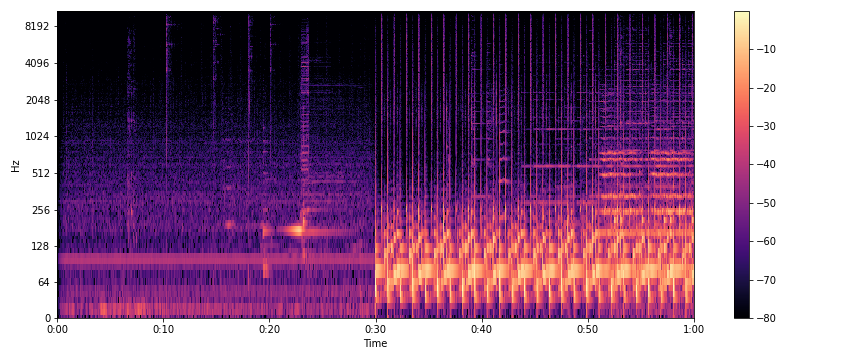

In [ ]:
plot_spec(y_dope, sr_dope ,12,5)

In [ ]:
display_audio(y_dope,sr_dope)

In [ ]:
y_dope_b, sr_dope_b = librosa.load(dope, offset = 0, duration = 2)
y_dope_d, sr_dope_d = librosa.load(dope, offset = 29, duration = 2)
y_dope_d1, sr_dope_d1 = librosa.load(dope, offset = 30, duration = 2)

In [ ]:
display_audio(y_dope_b, sr_dope_b)
display_audio(y_dope_d, sr_dope_d)
display_audio(y_dope_d1, sr_dope_d1)

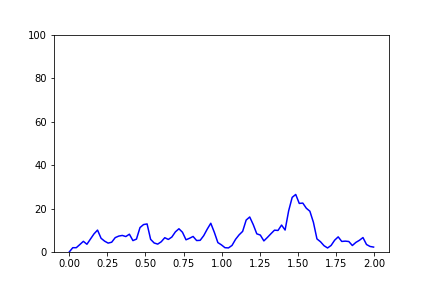

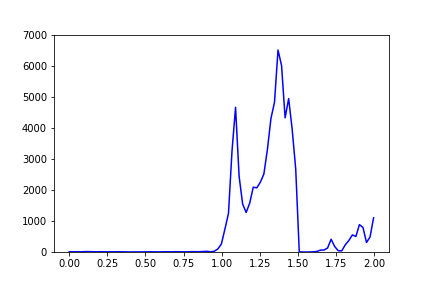

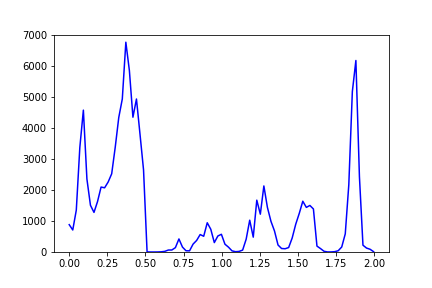

In [ ]:
ber_vs = calc_BER(y_dope_b, sr_dope_b ,2500, 100)
ber_vs = calc_BER(y_dope_d, sr_dope_d ,2500, 7000)
ber_vs = calc_BER(y_dope_d1, sr_dope_d1 ,2500, 7000)

In [ ]:


get_first_drum(2000, dope, 2500)

30.069659863945578

In [ ]:
with youtube_dl.YoutubeDL(ydl_opts) as ydl: 
  ydl.download(['https://www.youtube.com/watch?v=FJt7gNi3Nr4&ab_channel=KanyeWestVEVO'])

[youtube] FJt7gNi3Nr4: Downloading webpage
[download] Destination: Jay-Z & Kanye West - No Church In The Wild ft. Frank Ocean, The-Dream-FJt7gNi3Nr4.m4a
[download] 100% of 4.69MiB in 01:02
[ffmpeg] Correcting container in "Jay-Z & Kanye West - No Church In The Wild ft. Frank Ocean, The-Dream-FJt7gNi3Nr4.m4a"
[ffmpeg] Destination: Jay-Z & Kanye West - No Church In The Wild ft. Frank Ocean, The-Dream-FJt7gNi3Nr4.wav
Deleting original file Jay-Z & Kanye West - No Church In The Wild ft. Frank Ocean, The-Dream-FJt7gNi3Nr4.m4a (pass -k to keep)


In [ ]:
church = "/content/Jay-Z & Kanye West - No Church In The Wild ft. Frank Ocean, The-Dream-FJt7gNi3Nr4.wav"
y_church, sr_church = librosa.load(church, duration = 60) 


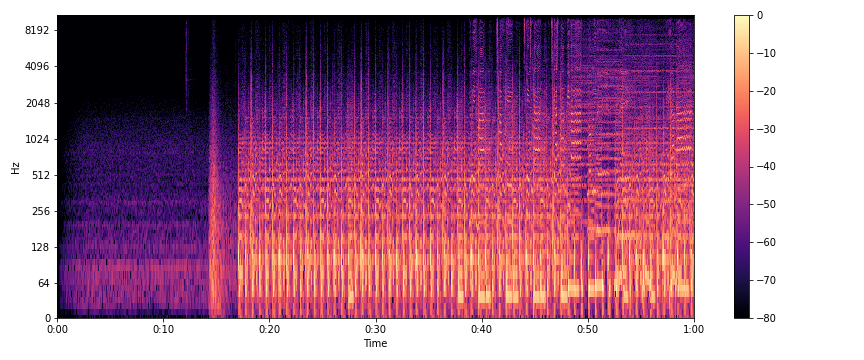

In [ ]:
plot_spec(y_church, sr_church, 12,5)

In [ ]:
display_audio(y_church, sr_church)

In [ ]:
y_church_b, sr_church_b = librosa.load(church, offset = 0, duration = 2)
y_church_d, sr_church_d = librosa.load(church, offset = 16, duration = 2)
y_church_d1, sr_church_d1 = librosa.load(church, offset = 25, duration = 2)

In [ ]:
display_audio(y_church_b, sr_church_b)
display_audio(y_church_d, sr_church_d)
display_audio(y_church_d1, sr_church_d1)

<ipython-input-95-1da5894b8c9d>:15: RuntimeWarning: invalid value encountered in float_scalars
  band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies


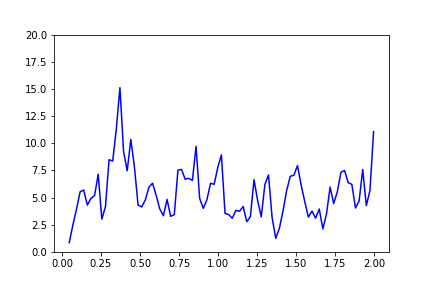

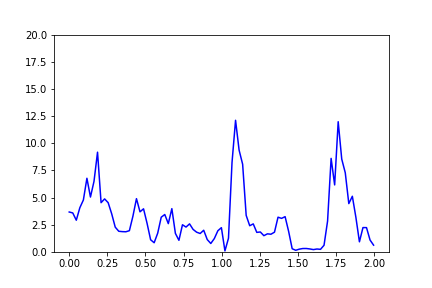

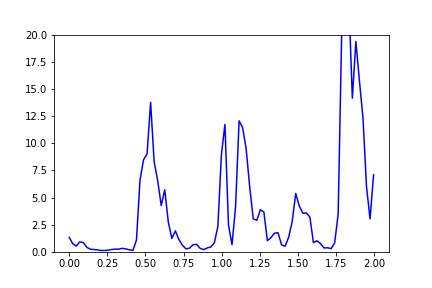

In [ ]:
ber_vs = calc_BER(y_church_b, sr_dope_b ,2500, 20)
ber_vs = calc_BER(y_church_d, sr_dope_d ,2500, 20)
ber_vs = calc_BER(y_church_d1, sr_dope_d1 ,2500, 20)

the kicks are identified, but the algorithem wont work because of noisy beggining.

#conclusion


1. we can see that the model is able to generelise, but require some hyper parameter tuning. 

hyper parameters- the model has 3 main hyper parameters- the limit frequency for BER calculations,  the chunk size for iterateting over the song, and pick tresh hold for identifying a sound pick.

while trying to use the algorithem on "dope lemon", I noticed that there is a relation between 1 and 2- it seems that when taking the 2 sec interval, 2500 is a good freq_lim for identifying the drum bits.

*note- those two parameters seems to be able to generelise, but I believe that they allow us to identify only kick drums(and are possibly related to BPM). in general, the model is fitted for identifying kicks- I suspect that sner drums, for example, requires a different method.

the third parameter is not generelising properly between the songs. but this parameter can be learned from the piece it self, by the standard deviation of the BER function.

2.noise-  "church in the wilde" face us with another difficulty- noisy begining. no tuned treshhold can help us- becuase the noise in the begining has similar spikes.

in "church" spectogram, we can see that the problem is not that there is no difference between the kick drum and the noise- the problem is that at the same time that the kick starts, higher frequencys magnitued also increase, and therefore, I believe, the BER picks are similar. 

I think that this could be solved by adding a weight to the total magnitued of the frequency, when calculating BER.


#a cherry
I think that solving 2 is out of scope for today. but lets try to solve 1-

we will try a naive aproach, of calculating 1.5 standard deviations of the 2sec time interval BER.

*i chose 1.5 after testing on viva and dope. with a bigger data set, we could optimize this parameter.

In [ ]:
def calc_lim_for_picks(link):
  #calculate the std of BER calculation over 2 sec chunks
  y_seg, sr_seg = librosa.load(link, offset = 0, duration =2 )
  curr_ber = calc_BER(y_seg, sr_seg,2500, 15, False)

  for i in range(2,50,2):
      y_seg, sr_seg = librosa.load(link, offset = i, duration =2 )
      seg_ber = calc_BER(y_seg, sr_seg,2500, 15, False)
      curr_ber =np.concatenate((curr_ber, seg_ber))
  curr_ber =np.nan_to_num(curr_ber)
  print(curr_ber)
  std = curr_ber.std()
  return 1.5*std



    

In [ ]:
std2_viva = calc_lim_for_picks(viva)

std2_dope = calc_lim_for_picks(dope)


<ipython-input-95-1da5894b8c9d>:15: RuntimeWarning: invalid value encountered in float_scalars
  band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies


[0.         0.         0.00292114 ... 0.26118043 0.24740264 0.3140986 ]
[1.2760218e-08 1.9723037e+00 1.9871510e+00 ... 4.0086856e+02 2.2653517e+02
 1.8577092e+02]


In [ ]:
print(std2_viva)
print(std2_dope)

3.2436819076538086
1410.9890441894531


In [ ]:
first_drum_viva = get_first_drum(std2_viva, viva)
first_drum_dope = get_first_drum(std2_dope, dope)

<ipython-input-95-1da5894b8c9d>:15: RuntimeWarning: invalid value encountered in float_scalars
  band_energy_ratio_current_frame = sum_power_low_frequencies / sum_power_high_frequencies


In [ ]:
print("viva first drum:", first_drum_viva)
print("dope first drum:", first_drum_dope)


viva first drum: 28.394739229024943
dope first drum: 30.069659863945578


it seems to work quit well!